In [49]:
from skimage import io, morphology, color, util, filters
import numpy as np
from PIL import Image

import matplotlib.pyplot as plt
import seaborn as sns

data = "example/"

In [116]:
img  = io.imread(data + 'first_image.jpg')
img_true  = io.imread(data + 'first_image_true.jpg')

img.shape

(2048, 2048, 3)

In [33]:
#img_gray = color.rgb2gray(img)
img_gray = img[:,:,2]

img_gray = util.img_as_ubyte(img_gray)
img_gray

array([[2, 4, 5, ..., 5, 4, 5],
       [3, 4, 5, ..., 6, 5, 4],
       [4, 5, 6, ..., 6, 5, 5],
       ...,
       [2, 2, 2, ..., 6, 4, 2],
       [2, 2, 2, ..., 6, 4, 2],
       [5, 2, 3, ..., 6, 5, 4]], dtype=uint8)

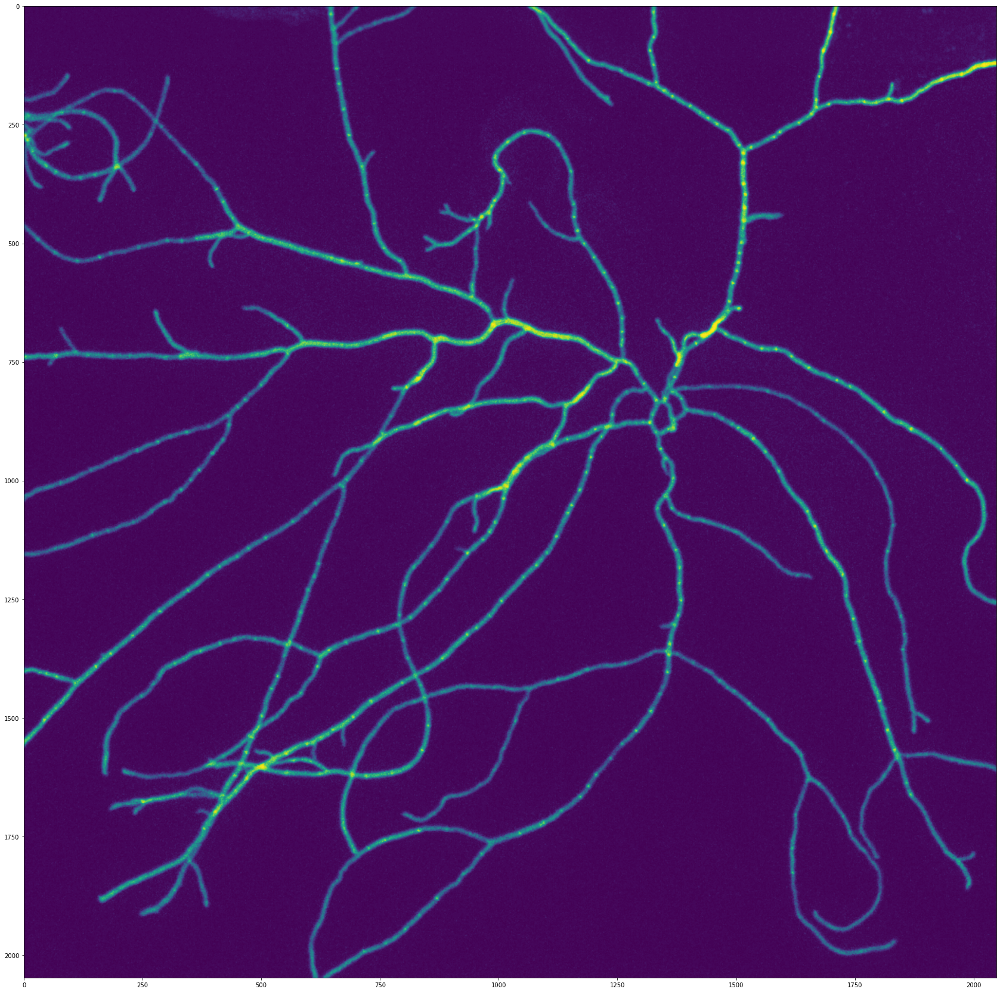

In [34]:
plt.figure(figsize=[30,30])
plt.imshow(img_gray)

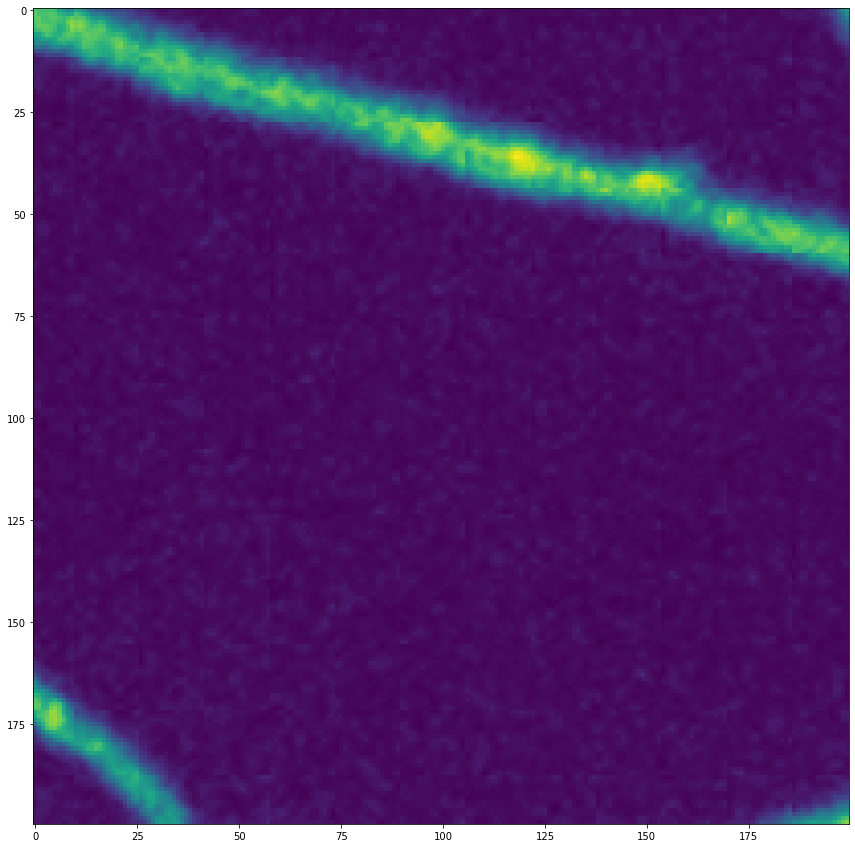

In [35]:
plt.figure(figsize=[15,15])
plt.imshow(img_gray[500:700, 550:750])

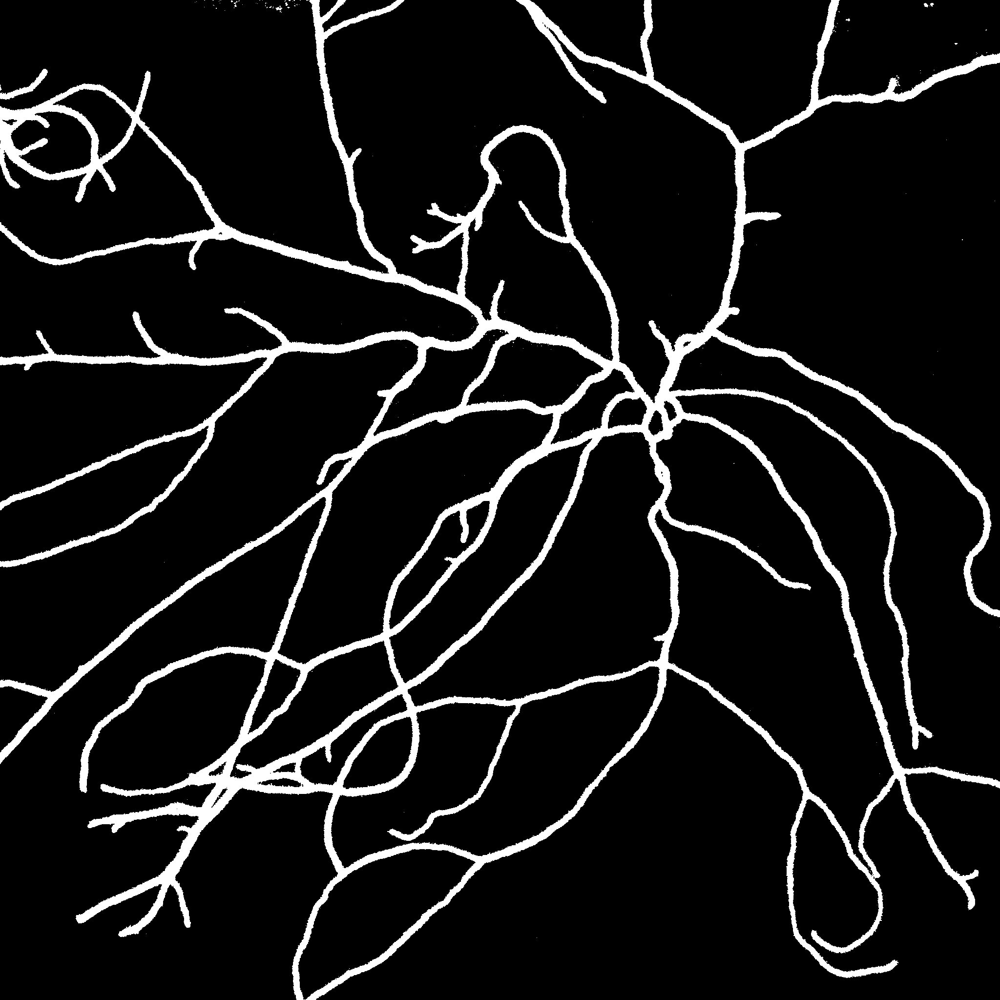

In [37]:
img_binarized = img_gray.copy()
img_binarized[img_binarized >= 25] = 255
img_binarized[img_binarized < 25] = 0

#plt.figure(figsize=[15,15])
#plt.imshow(img_binarized)

img_binarized = Image.fromarray(img_binarized).convert("1")
img_binarized

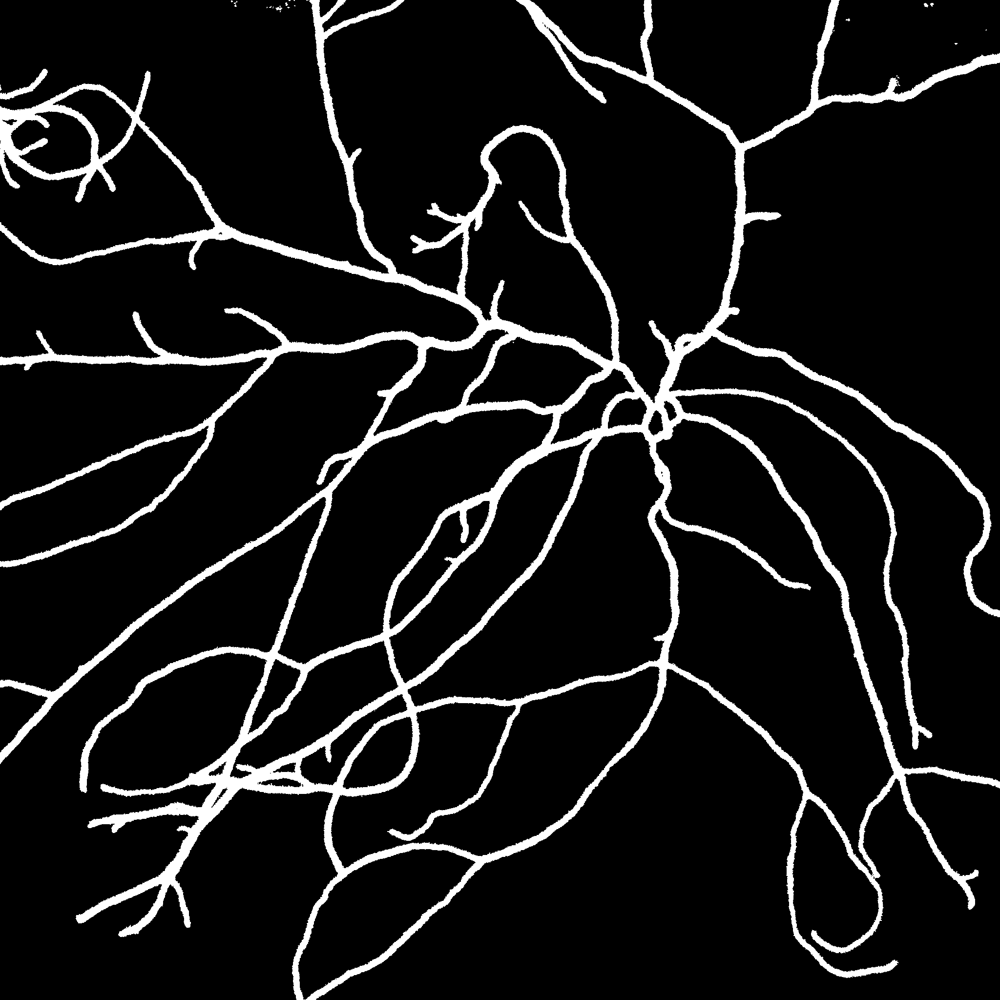

In [38]:
clean_binary_img = morphology.remove_small_objects(np.array(img_binarized), min_size=5)

img_open = Image.fromarray(clean_binary_img).convert("1")
img_open

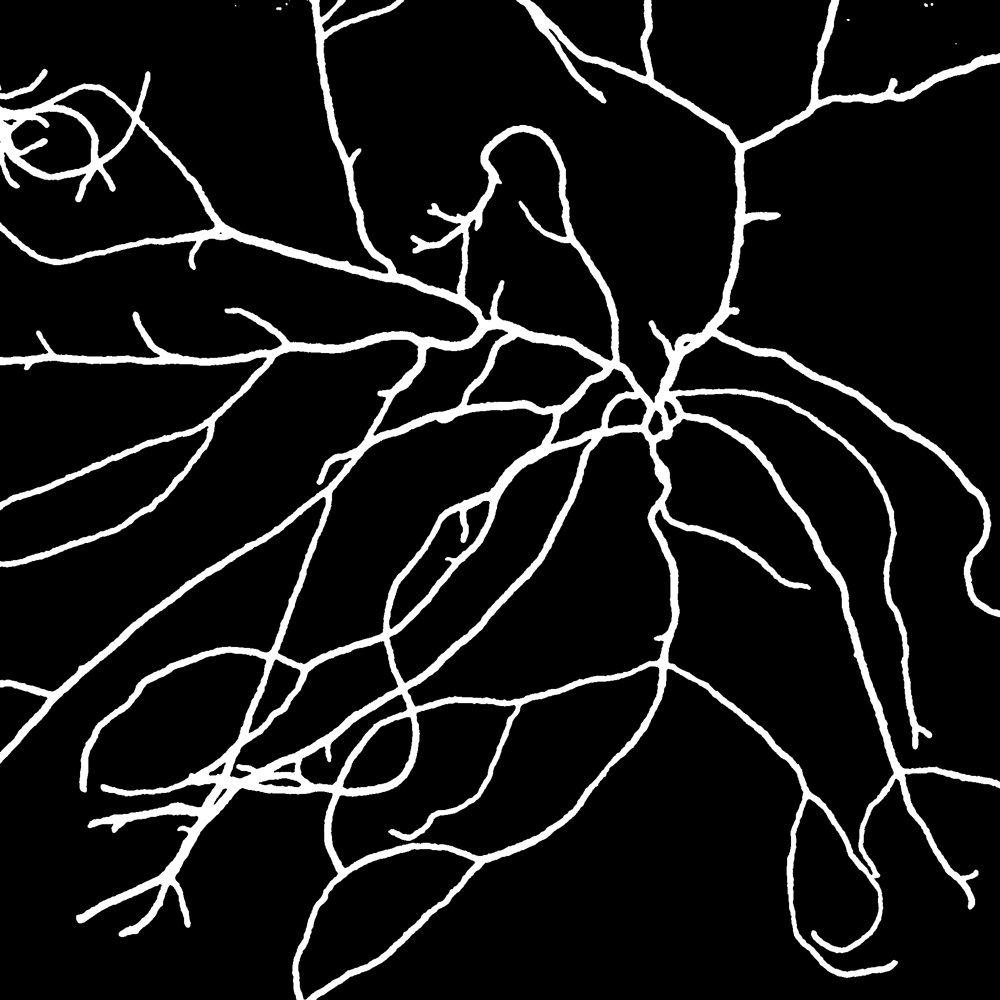

In [50]:
dilated_binary_img = filters.median(np.array(clean_binary_img), selem=morphology.square(5))
#dilated_binary_img = morphology.binary_erosion(np.array(clean_binary_img), selem=morphology.square(3))

img_open = Image.fromarray(dilated_binary_img).convert("1")
img_open

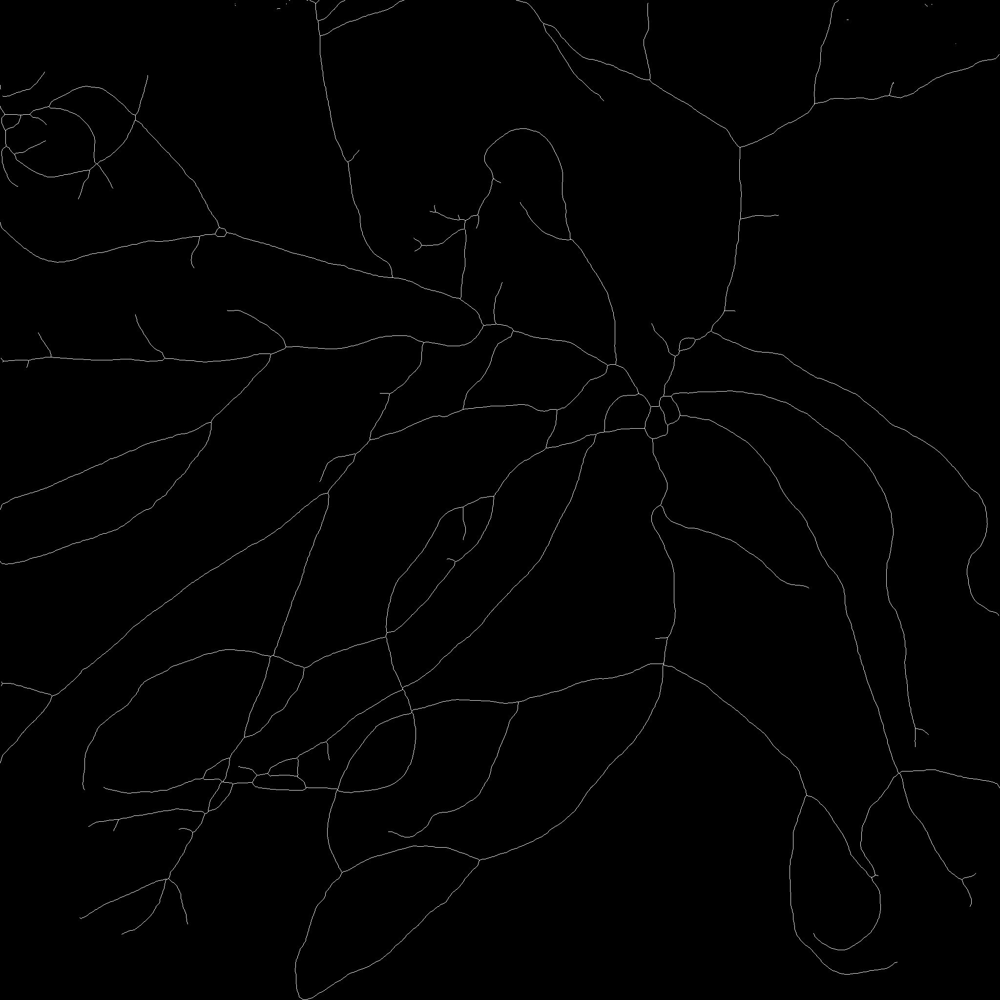

In [51]:
skeleton = morphology.skeletonize(dilated_binary_img)

#plt.figure(figsize=[15,15])
#plt.imshow(skeleton[500:700, 550:750])

img_open = Image.fromarray(skeleton).convert("1")
img_open

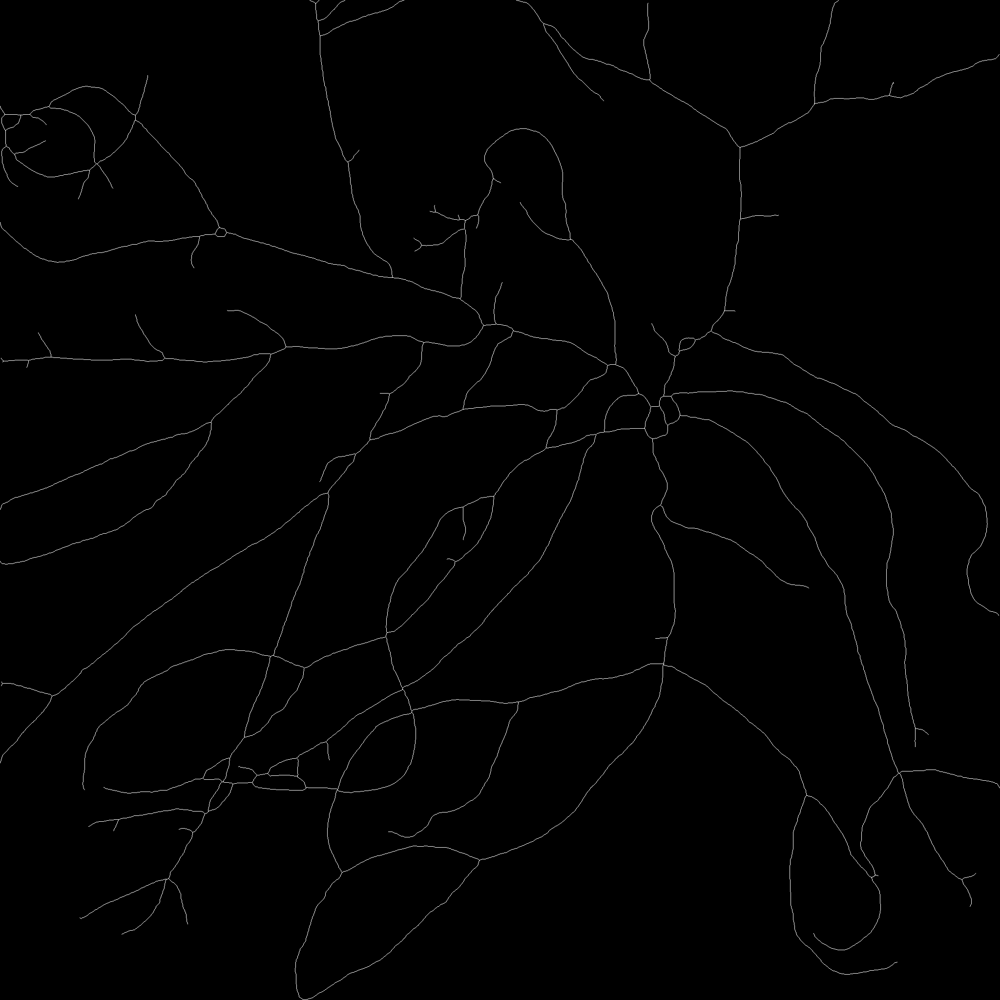

In [52]:
clean_skeleton = morphology.remove_small_objects(np.array(skeleton), min_size=100, connectivity=2)

img_open = Image.fromarray(clean_skeleton).convert("1")
img_open

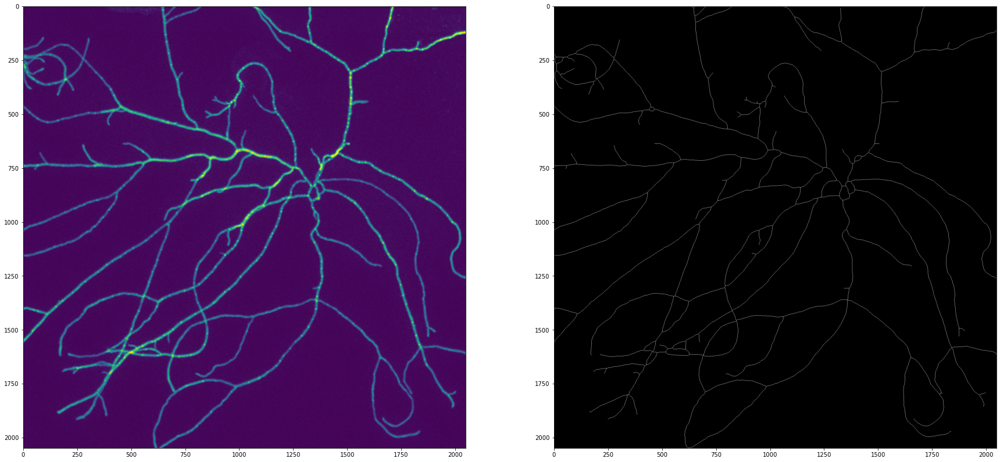

In [53]:
f, ax = plt.subplots(1,2, figsize=[30,30])
ax[0].imshow(img_gray)
ax[1].imshow(img_open)

In [54]:
padded_skeleton = np.pad(clean_skeleton, (2, 2), 'constant', constant_values=False)

h, w = padded_skeleton.shape

branches = np.full([h,w], False, dtype=bool)
tips = np.full([h,w], False, dtype=bool)

In [55]:
coords = np.argwhere(padded_skeleton)

In [66]:
for i in coords:
    x, y = i[0], i[1]
    neighbourhood = np.array(padded_skeleton[x-1:x+2, y-1:y+2])
    branch_neighbourhood = np.array(branches[x-3:x+4, y-3:y+4])
    if np.sum(neighbourhood) == 4 and np.sum(branch_neighbourhood) == 0:
        branches[x,y] = True
    elif np.sum(neighbourhood) == 2:
        tips[x,y] = True

In [67]:
np.sum(branches)

119

In [68]:
np.sum(tips)

69

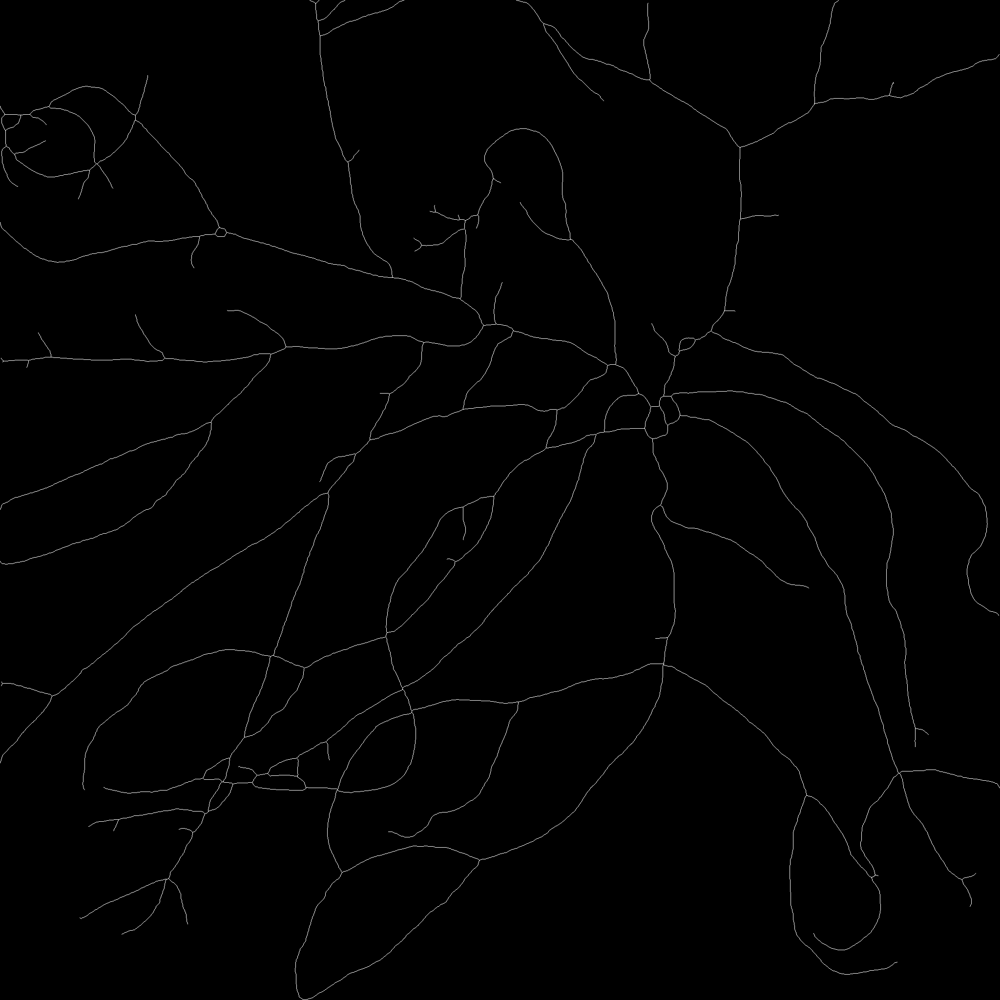

In [69]:
img_open

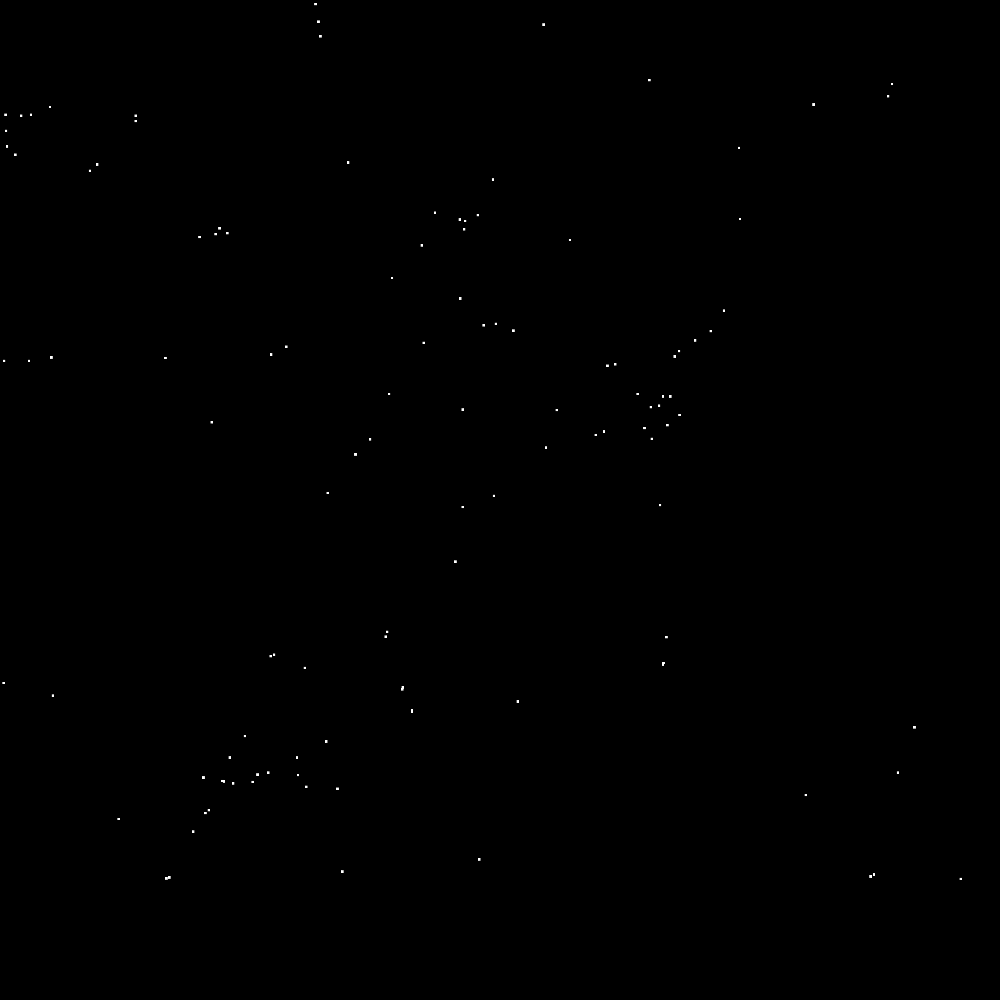

In [70]:
mark_branches = morphology.binary_dilation(branches, morphology.square(5))

Image.fromarray(mark_branches).convert("1")

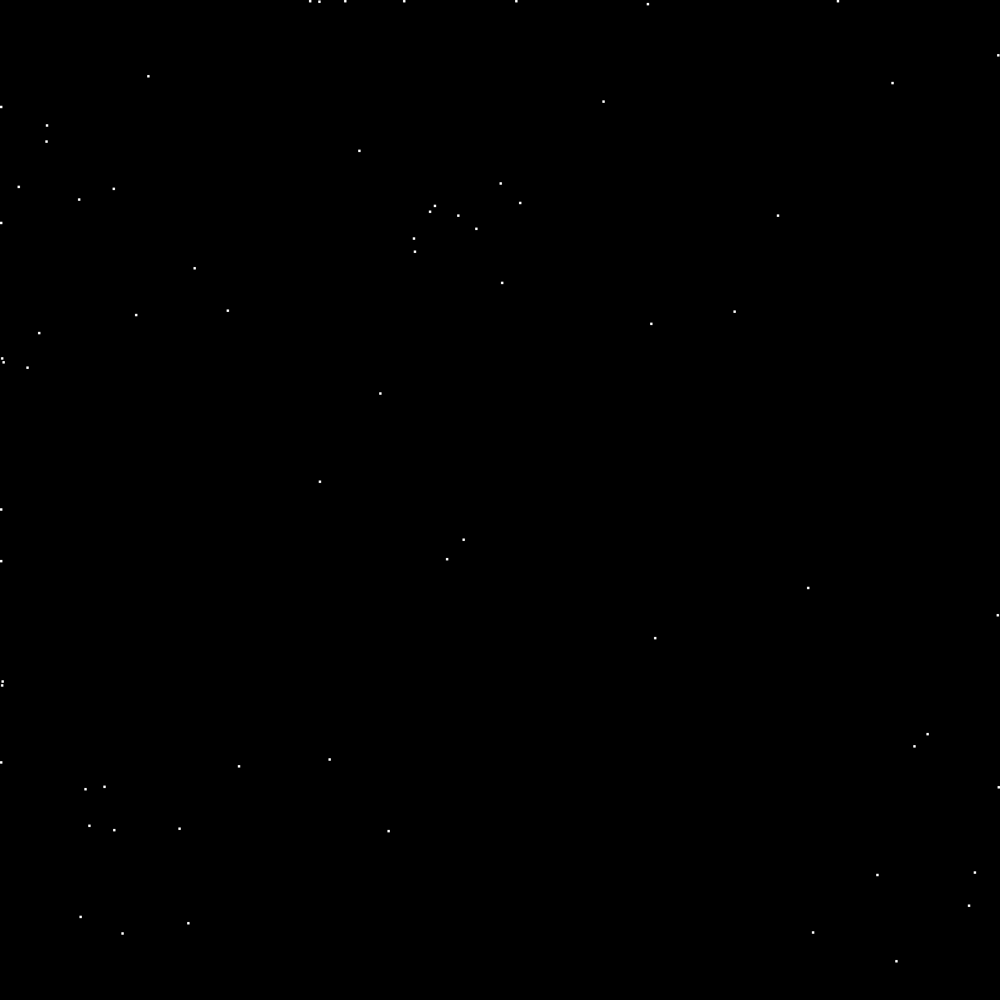

In [71]:
mark_tips = morphology.binary_dilation(tips, morphology.square(5))

Image.fromarray(mark_tips).convert("1")

In [72]:
pad_img_gray = np.pad(img_gray, (2, 2), 'constant', constant_values=0)

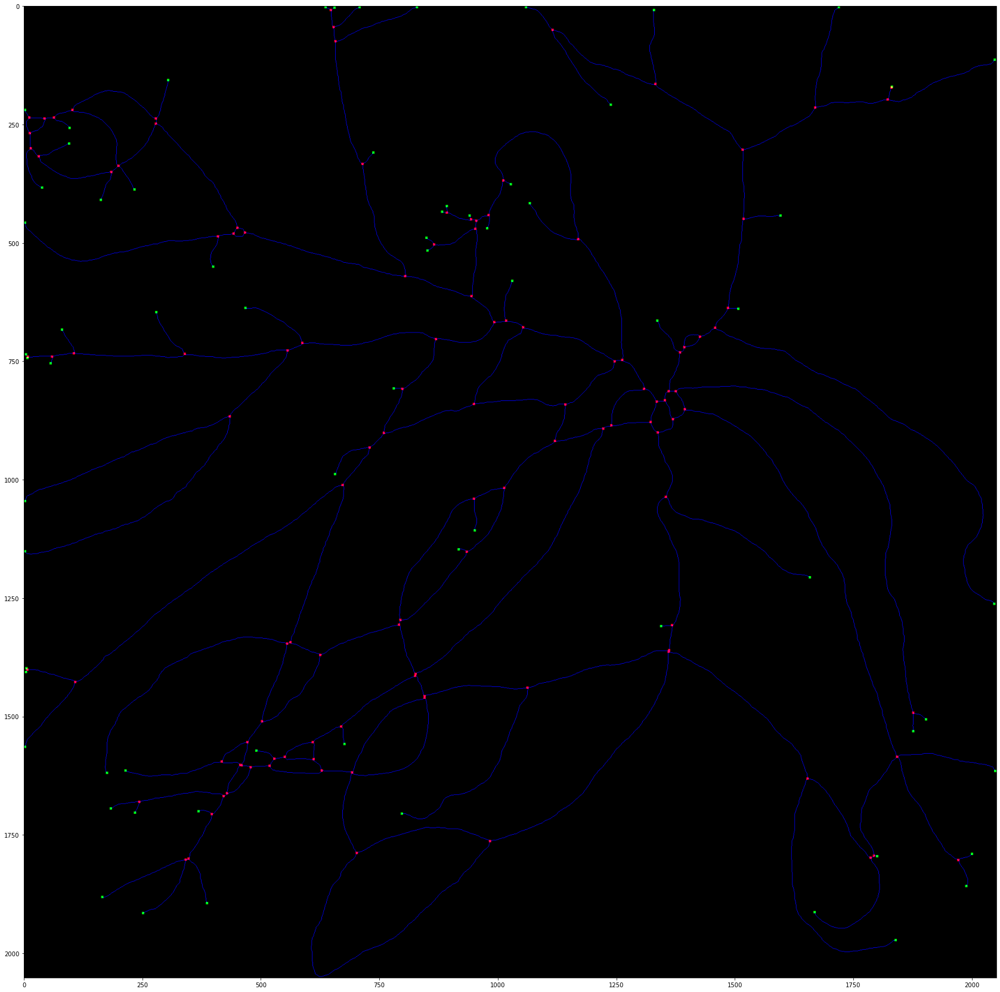

In [73]:
composite = np.array([mark_branches, mark_tips, padded_skeleton], dtype=np.uint8)*255

composite = np.swapaxes(composite, 0, 2)
composite = np.swapaxes(composite, 0, 1)

plt.figure(figsize=[30,30])
plt.imshow(composite)

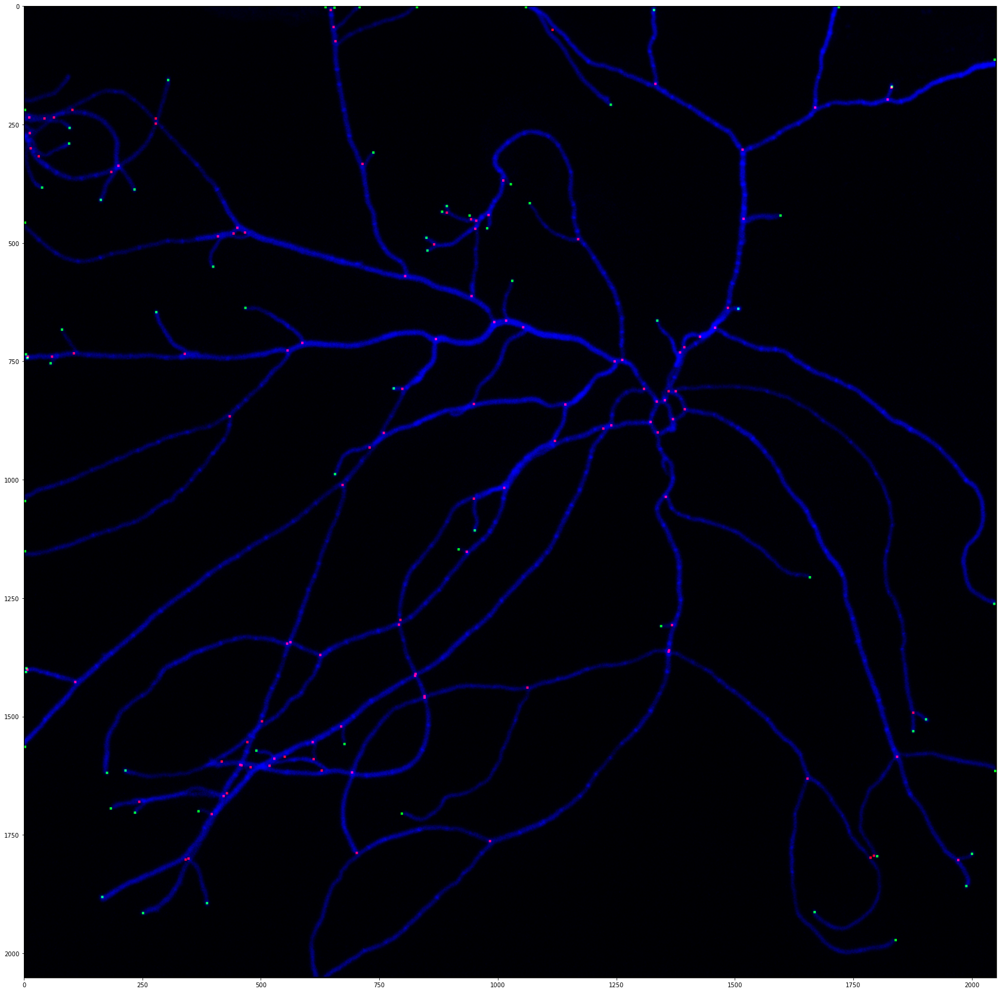

In [74]:
composite = np.array([mark_branches*255, mark_tips*255, pad_img_gray], dtype=np.uint8)

composite = np.swapaxes(composite, 0, 2)
composite = np.swapaxes(composite, 0, 1)

plt.figure(figsize=[30,30])
plt.imshow(composite)

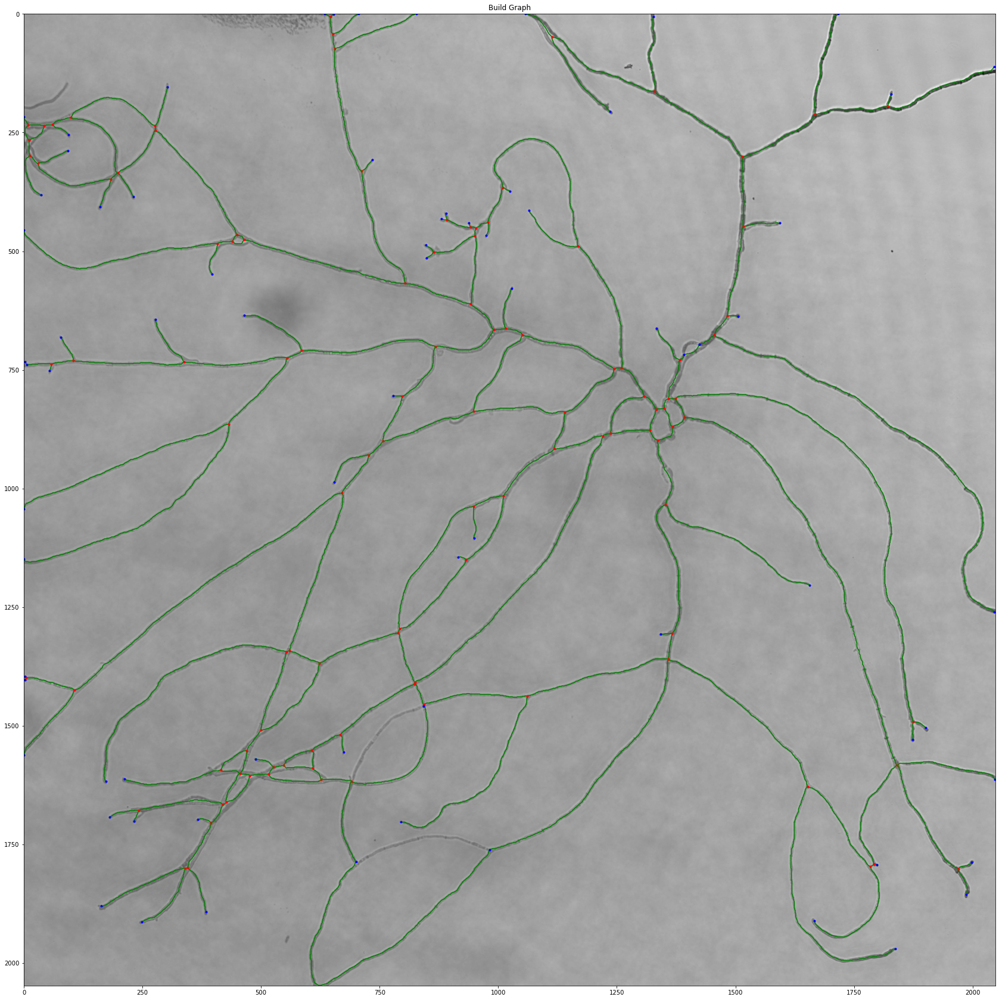

In [122]:
import sknw

# build graph from skeleton
graph = sknw.build_sknw(clean_skeleton)

plt.figure(figsize=[30,30])

# draw image
plt.imshow(img_true, cmap='gray')

# draw edges by pts
for (s,e) in graph.edges():
    ps = graph[s][e]['pts']
    plt.plot(ps[:,1], ps[:,0], 'green')
    
# draw node by o
nodes = graph.nodes()
bs = np.array([nodes[i]['o'] for i in nodes if len(graph.edges(i))>=3])
ts = np.array([nodes[i]['o'] for i in nodes if len(graph.edges(i))<=2])
plt.plot(bs[:,1], bs[:,0], 'r.')
plt.plot(ts[:,1], ts[:,0], 'b.')

# title and show
plt.title('Build Graph')
plt.show()

In [119]:
len(graph.edges(100))

3

In [118]:
ps

array([[0.00000000e+00, 6.34000000e+02],
       [0.00000000e+00, 7.06000000e+02],
       [0.00000000e+00, 8.27000000e+02],
       [0.00000000e+00, 1.05700000e+03],
       [0.00000000e+00, 1.71700000e+03],
       [1.00000000e+00, 6.53000000e+02],
       [6.25000000e+00, 6.46000000e+02],
       [6.00000000e+00, 1.32700000e+03],
       [4.23333333e+01, 6.51333333e+02],
       [4.83333333e+01, 1.11333333e+03],
       [7.30000000e+01, 6.55250000e+02],
       [1.11000000e+02, 2.04600000e+03],
       [1.54000000e+02, 3.02000000e+02],
       [1.62666667e+02, 1.32966667e+03],
       [1.69250000e+02, 1.82875000e+03],
       [1.94750000e+02, 1.82100000e+03],
       [2.06000000e+02, 1.23600000e+03],
       [2.12000000e+02, 1.66780000e+03],
       [2.17000000e+02, 0.00000000e+00],
       [2.17666667e+02, 9.96666667e+01],
       [2.34000000e+02, 9.25000000e+00],
       [2.33666667e+02, 6.06666667e+01],
       [2.35250000e+02, 4.20000000e+01],
       [2.35333333e+02, 2.76666667e+02],
       [2.457500

In [93]:
# Find branches
# Find endpoints
# For each branch endpoint pair, check if they connect, with no other checkpoint in middle of path


In [137]:
graph[10]

AtlasView({2: {'pts': array([[  0, 827],
       [  0, 826],
       [  0, 825],
       [  1, 824],
       [  1, 823],
       [  2, 822],
       [  2, 821],
       [  2, 820],
       [  2, 819],
       [  3, 818],
       [  3, 817],
       [  4, 816],
       [  5, 815],
       [  6, 814],
       [  6, 813],
       [  7, 812],
       [  8, 811],
       [  9, 810],
       [  9, 809],
       [ 10, 808],
       [ 11, 807],
       [ 12, 806],
       [ 13, 805],
       [ 13, 804],
       [ 14, 803],
       [ 15, 802],
       [ 15, 801],
       [ 15, 800],
       [ 16, 799],
       [ 16, 798],
       [ 17, 797],
       [ 17, 796],
       [ 18, 795],
       [ 19, 794],
       [ 19, 793],
       [ 19, 792],
       [ 20, 791],
       [ 20, 790],
       [ 20, 789],
       [ 21, 788],
       [ 21, 787],
       [ 21, 786],
       [ 22, 785],
       [ 22, 784],
       [ 22, 783],
       [ 22, 782],
       [ 23, 781],
       [ 23, 780],
       [ 24, 779],
       [ 24, 778],
       [ 24, 777],
       [ 